## Importing required libraries for EDA (Exploratory Data Analysis)

In [1]:
import pandas as pd
import numpy as np

import category_encoders as ce
from category_encoders import target_encoder as te

#visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt

pd.pandas.set_option('display.max_columns',None, 'display.max_rows', None)

### 1. Loading dataset

In [2]:
file = './Dataset/house-prices-advanced-regression-techniques/train.csv'

In [3]:
data = pd.read_csv(file)
data.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
data.shape

(1460, 81)

### 2. Data Types

In [5]:
data.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


### 3. Managing NULL, missing values and unwanted columns

In [6]:
data.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [7]:
# dropping columns with more than 80% of missing / NULL values
data.dropna(thresh=data.shape[0]*0.8, how='all', axis=1, inplace=True)

In [8]:
data.shape

(1460, 76)

In [9]:
req_cols = ['Id', 'MSZoning', 'LotArea', 'LotFrontage', 'LotShape', 'Street', 'Utilities', 'Neighbourhood', 'OverallCond', 'YearBuilt', 'BsmtCond', 'TotalBsmtSF', 'HeatingQC', 'CentralAir', '1stFlrSF' , '2ndFlrSF', 'KitchenAbvGr', 'BedroomAbvGr', 'GarageYrBlt', 'GarageArea', 'EnclosedPorch', 'PoolArea', 'MoSold', 'YrSold', 'SalePrice']
final_data = [col for col in data.columns if col not in req_cols]

data.drop(columns=final_data, inplace=True)
data

,Id,MSZoning,LotFrontage,LotArea,Street,LotShape,Utilities,OverallCond,YearBuilt,BsmtCond,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,BedroomAbvGr,KitchenAbvGr,GarageYrBlt,GarageArea,EnclosedPorch,PoolArea,MoSold,YrSold,SalePrice
0,1,RL,65.0,8450,Pave,Reg,AllPub,5,2003,TA,856,Ex,Y,856,854,3,1,2003.0,548,0,0,2,2008,208500
1,2,RL,80.0,9600,Pave,Reg,AllPub,8,1976,TA,1262,Ex,Y,1262,0,3,1,1976.0,460,0,0,5,2007,181500
2,3,RL,68.0,11250,Pave,IR1,AllPub,5,2001,TA,920,Ex,Y,920,866,3,1,2001.0,608,0,0,9,2008,223500
3,4,RL,60.0,9550,Pave,IR1,AllPub,5,1915,Gd,756,Gd,Y,961,756,3,1,1998.0,642,272,0,2,2006,140000
4,5,RL,84.0,14260,Pave,IR1,AllPub,5,2000,TA,1145,Ex,Y,1145,1053,4,1,2000.0,836,0,0,12,2008,250000
5,6,RL,85.0,14115,Pave,IR1,AllPub,5,1993,TA,796,Ex,Y,796,566,1,1,1993.0,480,0,0,10,2009,143000
6,7,RL,75.0,10084,Pave,Reg,AllPub,5,2004,TA,1686,Ex,Y,1694,0,3,1,2004.0,636,0,0,8,2007,307000
7,8,RL,NaN,10382,Pave,IR1,AllPub,6,1973,TA,1107,Ex,Y,1107,983,3,1,1973.0,484,228,0,11,2009,200000
8,9,RM,51.0,6120,Pave,Reg,AllPub,5,1931,TA,952,Gd,Y,1022,752,2,2,1931.0,468,205,0,4,2008,129900
9,10,RL,50.0,7420,Pave,Reg,AllPub,6,1939,TA,991,Ex,Y,1077,0,2,2,1939.0,205,0,0,1,2008,118000


In [11]:
data.shape

(1460, 24)

In [9]:
# X, y = data.drop(columns=["SalePrice"]), data["SalePrice"]

In [10]:
# encoder = te.TargetEncoder(verbose=1,
#                 drop_invariant=False)

In [11]:
# encoder.fit(X,y)

In [12]:
data

,Id,MSZoning,LotFrontage,LotArea,Street,LotShape,Utilities,OverallCond,YearBuilt,BsmtCond,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,BedroomAbvGr,KitchenAbvGr,GarageYrBlt,GarageArea,EnclosedPorch,PoolArea,MoSold,YrSold,SalePrice
0,1,RL,65.0,8450,Pave,Reg,AllPub,5,2003,TA,856,Ex,Y,856,854,3,1,2003.0,548,0,0,2,2008,208500
1,2,RL,80.0,9600,Pave,Reg,AllPub,8,1976,TA,1262,Ex,Y,1262,0,3,1,1976.0,460,0,0,5,2007,181500
2,3,RL,68.0,11250,Pave,IR1,AllPub,5,2001,TA,920,Ex,Y,920,866,3,1,2001.0,608,0,0,9,2008,223500
3,4,RL,60.0,9550,Pave,IR1,AllPub,5,1915,Gd,756,Gd,Y,961,756,3,1,1998.0,642,272,0,2,2006,140000
4,5,RL,84.0,14260,Pave,IR1,AllPub,5,2000,TA,1145,Ex,Y,1145,1053,4,1,2000.0,836,0,0,12,2008,250000
5,6,RL,85.0,14115,Pave,IR1,AllPub,5,1993,TA,796,Ex,Y,796,566,1,1,1993.0,480,0,0,10,2009,143000
6,7,RL,75.0,10084,Pave,Reg,AllPub,5,2004,TA,1686,Ex,Y,1694,0,3,1,2004.0,636,0,0,8,2007,307000
7,8,RL,NaN,10382,Pave,IR1,AllPub,6,1973,TA,1107,Ex,Y,1107,983,3,1,1973.0,484,228,0,11,2009,200000
8,9,RM,51.0,6120,Pave,Reg,AllPub,5,1931,TA,952,Gd,Y,1022,752,2,2,1931.0,468,205,0,4,2008,129900
9,10,RL,50.0,7420,Pave,Reg,AllPub,6,1939,TA,991,Ex,Y,1077,0,2,2,1939.0,205,0,0,1,2008,118000


### 4. Duplicate values

In [13]:
print('Number of duplicate rows - ',data[data.duplicated()].shape)

Number of duplicate rows -  (0, 24)


### 5. Outliers

<AxesSubplot:xlabel='YrSold'>

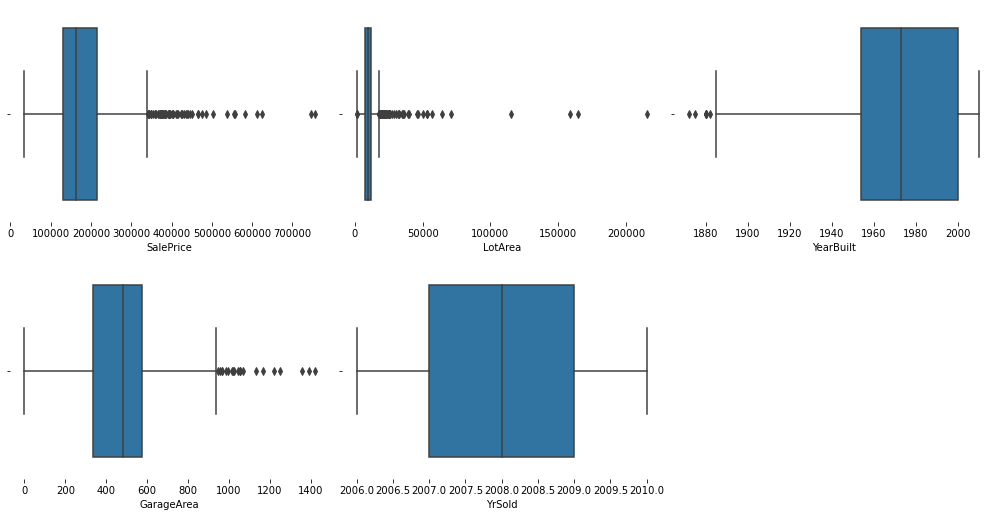

In [16]:
plt.figure(figsize=(14,14),tight_layout=True)

plt.subplot(4,3,1,frameon=False)
sns.boxplot(x=data['SalePrice'])

plt.subplot(4,3,2,frameon=False)
sns.boxplot(x=data['LotArea'])

plt.subplot(4,3,3,frameon=False)
sns.boxplot(x=data['YearBuilt'])

plt.subplot(4,3,4,frameon=False)
sns.boxplot(x=data['GarageArea'])

plt.subplot(4,3,5,frameon=False)
sns.boxplot(x=data['YrSold'])

### 6. Pairplot

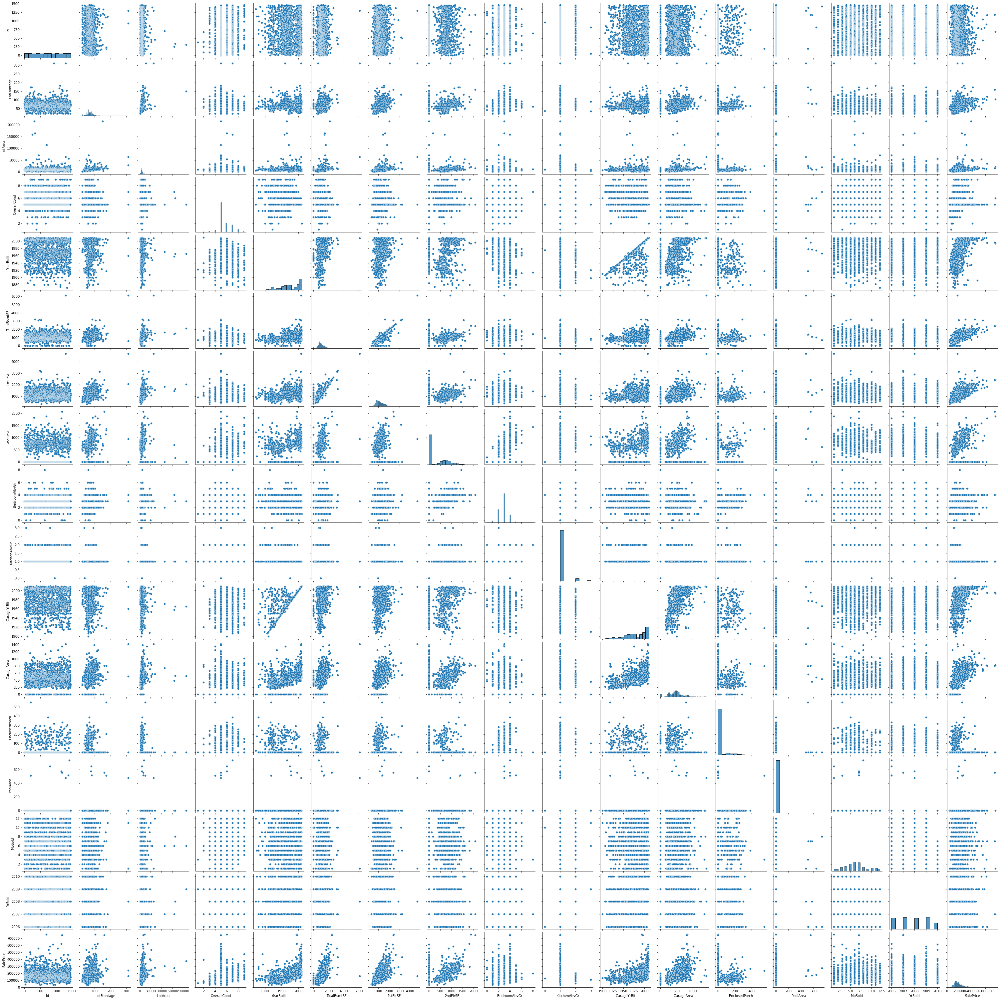

In [17]:
sns_pairplot = sns.pairplot(data)
# fig = sns_pairplot.get_figure()
# fig.savefig("pairplot.png")

### 7. Correlation Matrix

<AxesSubplot:>

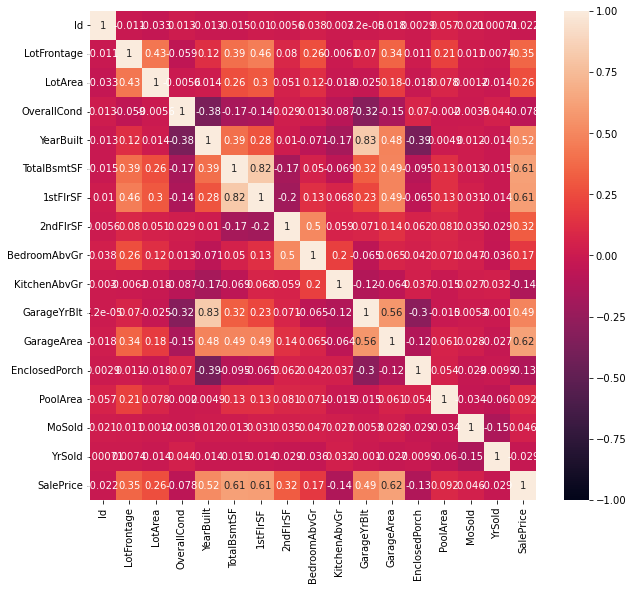

In [13]:
plt.figure(figsize=(10,9))
sns.heatmap(data.corr(),annot=True, vmin = -1, vmax = 1 )

### 8. Scatter plot

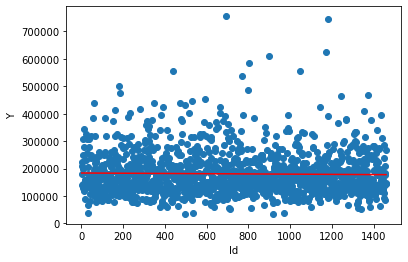

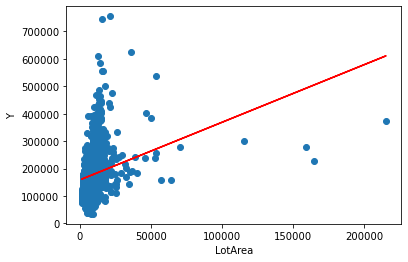

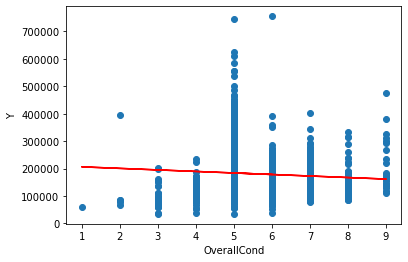

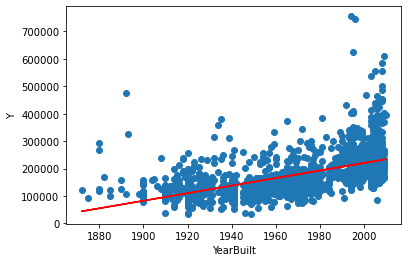

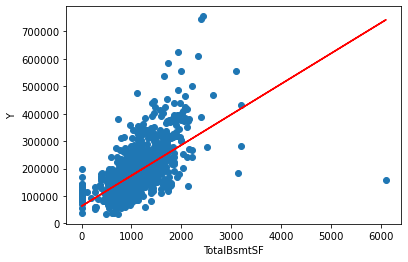

...

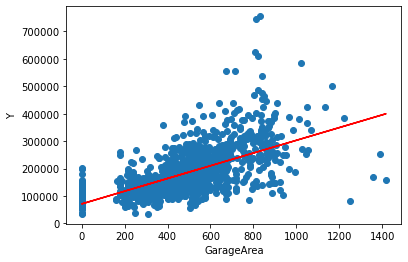

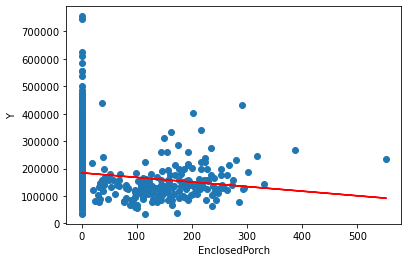

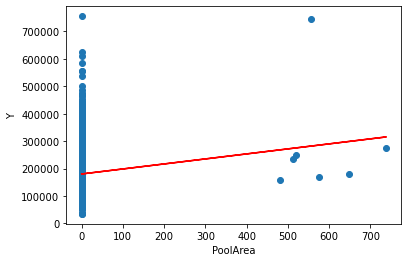

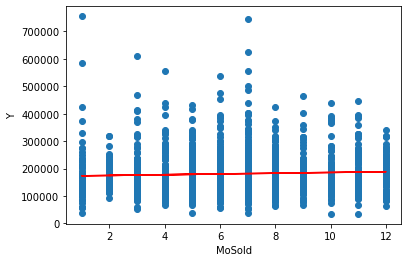

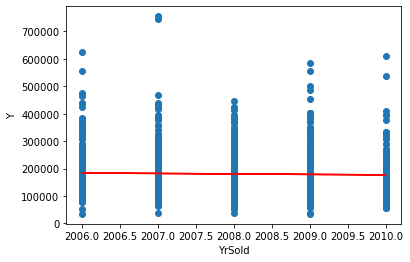

In [14]:
numeric_cols=[feature for feature in data.columns if data[feature].dtype == 'int64']
Y = data['SalePrice']
for i in range(len(numeric_cols) - 1):
    
    m,b = np.polyfit(data[numeric_cols[i]],Y, 1)
    plt.plot(data[numeric_cols[i]], m*data[numeric_cols[i]] + b, color = 'r')
    plt.scatter(data[numeric_cols[i]], Y)
    plt.xlabel(numeric_cols[i])
    plt.ylabel("Y")
    plt.show()

## Correlation
### 1. Positive Correlation
    Positive correlation is a relationship between two variables in which both variables move in the same direction.A positive correlation exists when one variable decreases as the other variable decreases, or one variable increases while the other increases.As year when house was built increases, the prices of the house also increases.

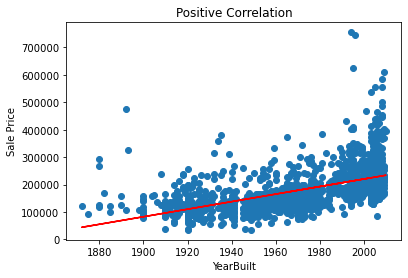

In [15]:
m,b = np.polyfit(data['YearBuilt'],Y, 1)
plt.plot(data['YearBuilt'], m*data['YearBuilt'] + b, color = 'r')
plt.scatter(data['YearBuilt'], Y)
plt.title('Positive Correlation')
plt.xlabel('YearBuilt')
plt.ylabel("Sale Price")
plt.savefig('pos_corr.jpg')
plt.show()

### 2. Negative Correlation
    Negative correlation is a relationship between two variables in which both variables move in the opposite direction.A negative correlation exists when one variable decreases as the other variable increases, or one variable increases while the other decreases.As area of enclosed porch increases, the prices of the house decrease.

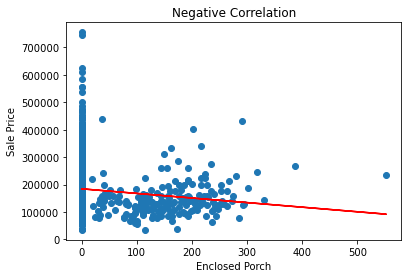

In [16]:
m,b = np.polyfit(data['EnclosedPorch'],Y, 1)
plt.plot(data['EnclosedPorch'], m*data['EnclosedPorch'] + b, color = 'r')
plt.scatter(data['EnclosedPorch'], Y)
plt.title('Negative Correlation')
plt.xlabel('Enclosed Porch')
plt.ylabel("Sale Price")
plt.savefig('neg_corr.jpg')
plt.show()

### 3. Least Correlation
    Month when house was sold has not effect on sales price of the house.

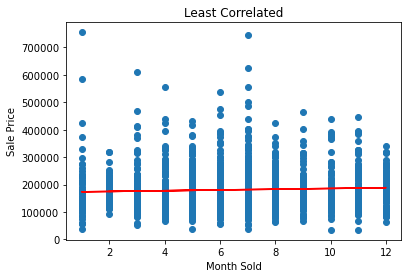

In [17]:
m,b = np.polyfit(data['MoSold'],Y, 1)
plt.plot(data['MoSold'], m*data['MoSold'] + b, color = 'r')
plt.scatter(data['MoSold'], Y)
plt.title('Least Correlated')
plt.xlabel('Month Sold')
plt.ylabel("Sale Price")
plt.savefig('no_corr.jpg')
plt.show()

### 9. Merging Two Dataframes

In [18]:
numeric = data.filter(items=numeric_cols)
categorical_cols = [feature for feature in data.columns if data[feature].dtype == 'object']
categorical_cols.append('Id')
categorical = data.filter(items=categorical_cols)
numeric

,Id,LotArea,OverallCond,YearBuilt,TotalBsmtSF,1stFlrSF,2ndFlrSF,BedroomAbvGr,KitchenAbvGr,GarageArea,EnclosedPorch,PoolArea,MoSold,YrSold,SalePrice
0,1,8450,5,2003,856,856,854,3,1,548,0,0,2,2008,208500
1,2,9600,8,1976,1262,1262,0,3,1,460,0,0,5,2007,181500
2,3,11250,5,2001,920,920,866,3,1,608,0,0,9,2008,223500
3,4,9550,5,1915,756,961,756,3,1,642,272,0,2,2006,140000
4,5,14260,5,2000,1145,1145,1053,4,1,836,0,0,12,2008,250000
5,6,14115,5,1993,796,796,566,1,1,480,0,0,10,2009,143000
6,7,10084,5,2004,1686,1694,0,3,1,636,0,0,8,2007,307000
7,8,10382,6,1973,1107,1107,983,3,1,484,228,0,11,2009,200000
8,9,6120,5,1931,952,1022,752,2,2,468,205,0,4,2008,129900
9,10,7420,6,1939,991,1077,0,2,2,205,0,0,1,2008,118000


In [19]:
categorical

,MSZoning,Street,LotShape,Utilities,BsmtCond,HeatingQC,CentralAir,Id
0,RL,Pave,Reg,AllPub,TA,Ex,Y,1
1,RL,Pave,Reg,AllPub,TA,Ex,Y,2
2,RL,Pave,IR1,AllPub,TA,Ex,Y,3
3,RL,Pave,IR1,AllPub,Gd,Gd,Y,4
4,RL,Pave,IR1,AllPub,TA,Ex,Y,5
5,RL,Pave,IR1,AllPub,TA,Ex,Y,6
6,RL,Pave,Reg,AllPub,TA,Ex,Y,7
7,RL,Pave,IR1,AllPub,TA,Ex,Y,8
8,RM,Pave,Reg,AllPub,TA,Gd,Y,9
9,RL,Pave,Reg,AllPub,TA,Ex,Y,10


In [20]:
res = pd.merge(numeric, categorical)

In [21]:
res

,Id,LotArea,OverallCond,YearBuilt,TotalBsmtSF,1stFlrSF,2ndFlrSF,BedroomAbvGr,KitchenAbvGr,GarageArea,EnclosedPorch,PoolArea,MoSold,YrSold,SalePrice,MSZoning,Street,LotShape,Utilities,BsmtCond,HeatingQC,CentralAir
0,1,8450,5,2003,856,856,854,3,1,548,0,0,2,2008,208500,RL,Pave,Reg,AllPub,TA,Ex,Y
1,2,9600,8,1976,1262,1262,0,3,1,460,0,0,5,2007,181500,RL,Pave,Reg,AllPub,TA,Ex,Y
2,3,11250,5,2001,920,920,866,3,1,608,0,0,9,2008,223500,RL,Pave,IR1,AllPub,TA,Ex,Y
3,4,9550,5,1915,756,961,756,3,1,642,272,0,2,2006,140000,RL,Pave,IR1,AllPub,Gd,Gd,Y
4,5,14260,5,2000,1145,1145,1053,4,1,836,0,0,12,2008,250000,RL,Pave,IR1,AllPub,TA,Ex,Y
5,6,14115,5,1993,796,796,566,1,1,480,0,0,10,2009,143000,RL,Pave,IR1,AllPub,TA,Ex,Y
6,7,10084,5,2004,1686,1694,0,3,1,636,0,0,8,2007,307000,RL,Pave,Reg,AllPub,TA,Ex,Y
7,8,10382,6,1973,1107,1107,983,3,1,484,228,0,11,2009,200000,RL,Pave,IR1,AllPub,TA,Ex,Y
8,9,6120,5,1931,952,1022,752,2,2,468,205,0,4,2008,129900,RM,Pave,Reg,AllPub,TA,Gd,Y
9,10,7420,6,1939,991,1077,0,2,2,205,0,0,1,2008,118000,RL,Pave,Reg,AllPub,TA,Ex,Y


### 10. Slicing Data

In [22]:
def slicing_data(column, category):
    sliced_data = res[res[column] == category]
    return sliced_data

In [23]:
LotConfig_Inside = res[res['LotConfig'] == 'Inside']
slicing_data('LotConfig', 'Inside')

KeyError: 'LotConfig'

In [ ]:
data['Neighborhood'].nunique

### 11. Representing as Matrix

In [24]:
data_numpy = data.to_numpy()

### 12. Upload data to NumPy

In [25]:
data_numpy

array([[1, 'RL', 65.0, ..., 2, 2008, 208500],
       [2, 'RL', 80.0, ..., 5, 2007, 181500],
       [3, 'RL', 68.0, ..., 9, 2008, 223500],
       ...,
       [1458, 'RL', 66.0, ..., 5, 2010, 266500],
       [1459, 'RL', 68.0, ..., 4, 2010, 142125],
       [1460, 'RL', 75.0, ..., 6, 2008, 147500]], dtype=object)

### 13. Slice Data

In [26]:
data_numpy[0:20]

array([[1, 'RL', 65.0, 8450, 'Pave', 'Reg', 'AllPub', 5, 2003, 'TA', 856,
        'Ex', 'Y', 856, 854, 3, 1, 2003.0, 548, 0, 0, 2, 2008, 208500],
       [2, 'RL', 80.0, 9600, 'Pave', 'Reg', 'AllPub', 8, 1976, 'TA',
        1262, 'Ex', 'Y', 1262, 0, 3, 1, 1976.0, 460, 0, 0, 5, 2007,
        181500],
       [3, 'RL', 68.0, 11250, 'Pave', 'IR1', 'AllPub', 5, 2001, 'TA',
        920, 'Ex', 'Y', 920, 866, 3, 1, 2001.0, 608, 0, 0, 9, 2008,
        223500],
       [4, 'RL', 60.0, 9550, 'Pave', 'IR1', 'AllPub', 5, 1915, 'Gd', 756,
        'Gd', 'Y', 961, 756, 3, 1, 1998.0, 642, 272, 0, 2, 2006, 140000],
       [5, 'RL', 84.0, 14260, 'Pave', 'IR1', 'AllPub', 5, 2000, 'TA',
        1145, 'Ex', 'Y', 1145, 1053, 4, 1, 2000.0, 836, 0, 0, 12, 2008,
        250000],
       [6, 'RL', 85.0, 14115, 'Pave', 'IR1', 'AllPub', 5, 1993, 'TA',
        796, 'Ex', 'Y', 796, 566, 1, 1, 1993.0, 480, 0, 0, 10, 2009,
        143000],
       [7, 'RL', 75.0, 10084, 'Pave', 'Reg', 'AllPub', 5, 2004, 'TA',
        1686

### 14. Conditions and Segrigations

In [27]:
latest_builds = data[data['YearBuilt'] >= 2000]

In [28]:
latest_builds

,Id,MSZoning,LotFrontage,LotArea,Street,LotShape,Utilities,OverallCond,YearBuilt,BsmtCond,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,BedroomAbvGr,KitchenAbvGr,GarageYrBlt,GarageArea,EnclosedPorch,PoolArea,MoSold,YrSold,SalePrice
0,1,RL,65.0,8450,Pave,Reg,AllPub,5,2003,TA,856,Ex,Y,856,854,3,1,2003.0,548,0,0,2,2008,208500
2,3,RL,68.0,11250,Pave,IR1,AllPub,5,2001,TA,920,Ex,Y,920,866,3,1,2001.0,608,0,0,9,2008,223500
4,5,RL,84.0,14260,Pave,IR1,AllPub,5,2000,TA,1145,Ex,Y,1145,1053,4,1,2000.0,836,0,0,12,2008,250000
6,7,RL,75.0,10084,Pave,Reg,AllPub,5,2004,TA,1686,Ex,Y,1694,0,3,1,2004.0,636,0,0,8,2007,307000
11,12,RL,85.0,11924,Pave,IR1,AllPub,5,2005,TA,1175,Ex,Y,1182,1142,4,1,2005.0,736,0,0,7,2006,345000
13,14,RL,91.0,10652,Pave,IR1,AllPub,5,2006,TA,1494,Ex,Y,1494,0,3,1,2006.0,840,0,0,8,2007,279500
18,19,RL,66.0,13695,Pave,Reg,AllPub,5,2004,TA,1114,Ex,Y,1114,0,3,1,2004.0,576,0,0,6,2008,159000
20,21,RL,101.0,14215,Pave,IR1,AllPub,5,2005,TA,1158,Ex,Y,1158,1218,4,1,2005.0,853,0,0,11,2006,325300
22,23,RL,75.0,9742,Pave,Reg,AllPub,5,2002,TA,1777,Ex,Y,1795,0,3,1,2002.0,534,0,0,9,2008,230000
25,26,RL,110.0,14230,Pave,Reg,AllPub,5,2007,TA,1566,Ex,Y,1600,0,3,1,2007.0,890,0,0,7,2009,256300


In [29]:
old_builds = data[data['YearBuilt'] <= 2000]
old_builds

,Id,MSZoning,LotFrontage,LotArea,Street,LotShape,Utilities,OverallCond,YearBuilt,BsmtCond,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,BedroomAbvGr,KitchenAbvGr,GarageYrBlt,GarageArea,EnclosedPorch,PoolArea,MoSold,YrSold,SalePrice
1,2,RL,80.0,9600,Pave,Reg,AllPub,8,1976,TA,1262,Ex,Y,1262,0,3,1,1976.0,460,0,0,5,2007,181500
3,4,RL,60.0,9550,Pave,IR1,AllPub,5,1915,Gd,756,Gd,Y,961,756,3,1,1998.0,642,272,0,2,2006,140000
4,5,RL,84.0,14260,Pave,IR1,AllPub,5,2000,TA,1145,Ex,Y,1145,1053,4,1,2000.0,836,0,0,12,2008,250000
5,6,RL,85.0,14115,Pave,IR1,AllPub,5,1993,TA,796,Ex,Y,796,566,1,1,1993.0,480,0,0,10,2009,143000
7,8,RL,NaN,10382,Pave,IR1,AllPub,6,1973,TA,1107,Ex,Y,1107,983,3,1,1973.0,484,228,0,11,2009,200000
8,9,RM,51.0,6120,Pave,Reg,AllPub,5,1931,TA,952,Gd,Y,1022,752,2,2,1931.0,468,205,0,4,2008,129900
9,10,RL,50.0,7420,Pave,Reg,AllPub,6,1939,TA,991,Ex,Y,1077,0,2,2,1939.0,205,0,0,1,2008,118000
10,11,RL,70.0,11200,Pave,Reg,AllPub,5,1965,TA,1040,Ex,Y,1040,0,3,1,1965.0,384,0,0,2,2008,129500
12,13,RL,NaN,12968,Pave,IR2,AllPub,6,1962,TA,912,TA,Y,912,0,2,1,1962.0,352,0,0,9,2008,144000
14,15,RL,NaN,10920,Pave,IR1,AllPub,5,1960,TA,1253,TA,Y,1253,0,2,1,1960.0,352,176,0,5,2008,157000


In [30]:
is_2004 = data[data['YearBuilt'] == 2004]
is_2004

,Id,MSZoning,LotFrontage,LotArea,Street,LotShape,Utilities,OverallCond,YearBuilt,BsmtCond,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,BedroomAbvGr,KitchenAbvGr,GarageYrBlt,GarageArea,EnclosedPorch,PoolArea,MoSold,YrSold,SalePrice
6,7,RL,75.0,10084,Pave,Reg,AllPub,5,2004,TA,1686,Ex,Y,1694,0,3,1,2004.0,636,0,0,8,2007,307000
18,19,RL,66.0,13695,Pave,Reg,AllPub,5,2004,TA,1114,Ex,Y,1114,0,3,1,2004.0,576,0,0,6,2008,159000
35,36,RL,108.0,13418,Pave,Reg,AllPub,5,2004,TA,1117,Ex,Y,1132,1320,4,1,2004.0,691,0,0,9,2006,309000
57,58,RL,89.0,11645,Pave,IR1,AllPub,5,2004,TA,860,Ex,Y,860,860,3,1,2004.0,565,0,0,8,2006,196500
60,61,RL,63.0,13072,Pave,Reg,AllPub,5,2004,TA,1158,Ex,Y,1158,0,3,1,2006.0,576,0,0,5,2006,158000
65,66,RL,76.0,9591,Pave,Reg,AllPub,5,2004,TA,1143,Ex,Y,1143,1330,4,1,2004.0,852,0,0,10,2007,317000
145,146,RM,24.0,2522,Pave,Reg,AllPub,5,2004,TA,970,Ex,Y,970,739,3,1,2004.0,380,0,0,4,2006,130000
148,149,RL,63.0,7500,Pave,Reg,AllPub,5,2004,TA,1080,Ex,Y,1080,0,3,1,NaN,0,0,0,4,2008,141000
158,159,FV,100.0,12552,Pave,Reg,AllPub,5,2004,TA,991,Ex,Y,991,956,3,1,2004.0,678,0,0,5,2010,254900
168,169,RL,62.0,8244,Pave,IR1,AllPub,5,2004,TA,840,Ex,Y,840,880,3,1,2004.0,440,0,0,5,2007,183500


In [31]:
new_data.groupby(by=['YearBuilt']).count()

NameError: name 'new_data' is not defined

### 15. Statistics of Dataset

In [32]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
TotalBsmtSF,1460.0,1057.429452,438.705324,0.0,795.75,991.5,1298.25,6110.0
1stFlrSF,1460.0,1162.626712,386.587738,334.0,882.00,1087.0,1391.25,4692.0
2ndFlrSF,1460.0,346.992466,436.528436,0.0,0.00,0.0,728.00,2065.0
BedroomAbvGr,1460.0,2.866438,0.815778,0.0,2.00,3.0,3.00,8.0
KitchenAbvGr,1460.0,1.046575,0.220338,0.0,1.00,1.0,1.00,3.0


### 16. Selection of Categorical data

In [33]:
# used dataframe created above to separate numeric and categorical data

categorical

,MSZoning,Street,LotShape,Utilities,BsmtCond,HeatingQC,CentralAir,Id
0,RL,Pave,Reg,AllPub,TA,Ex,Y,1
1,RL,Pave,Reg,AllPub,TA,Ex,Y,2
2,RL,Pave,IR1,AllPub,TA,Ex,Y,3
3,RL,Pave,IR1,AllPub,Gd,Gd,Y,4
4,RL,Pave,IR1,AllPub,TA,Ex,Y,5
5,RL,Pave,IR1,AllPub,TA,Ex,Y,6
6,RL,Pave,Reg,AllPub,TA,Ex,Y,7
7,RL,Pave,IR1,AllPub,TA,Ex,Y,8
8,RM,Pave,Reg,AllPub,TA,Gd,Y,9
9,RL,Pave,Reg,AllPub,TA,Ex,Y,10


### Exploratory Data Analysis

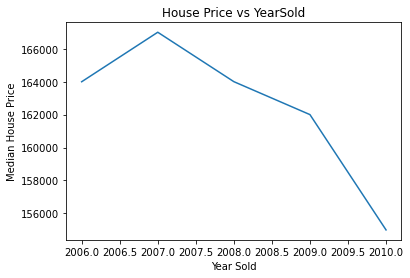

In [34]:
data.groupby('YrSold')['SalePrice'].median().plot()
plt.xlabel('Year Sold')
plt.ylabel('Median House Price')
plt.title("House Price vs YearSold")
plt.savefig('HousePricevsYearSold.jpg')
# fig = sns_pairplot.get_figure()
# fig.savefig("pairplot.png")

In [ ]:
data.shape